In [115]:
import os
import cv2 as cv
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import copy
from IPython.display import display

# Mask RCNN
import tensorflow as tf
from mrcnn import utils
from mrcnn import visualize
from mrcnn.visualize import display_images
import mrcnn.model as modellib
from mrcnn.model import log

%load_ext autoreload
%autoreload 2

import utils
import detector
import result

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


### Конфиг

In [110]:
# Данные
DATA_DIR = 'data/drive-download-20181101T093254Z-001/130151 dil50/'
OUTPUT_DIR = 'data/out2/'

# Модель
MODEL_DIR = 'models'
# WEIGHTS_PATH = 'models/mask_rcnn_vesicle_0014.h5'
WEIGHTS_PATH = 'logs/augment2/vesicle20181026T1754/mask_rcnn_vesicle_0013.h5'
DEVICE = '/cpu:0'

# Визуализация
DRAW_CONTOURS = True
DRAW_ELLIPSES = True
PALETTE = [(255, 0, 0), (0, 255, 0), (0, 0, 255)] #rgb

### Загрузка данных

In [111]:
config = detector.VesicleInferenceConfig()
images = utils.load_images(DATA_DIR)

In [112]:
with tf.device(DEVICE):
    model = modellib.MaskRCNN(mode="inference", model_dir=MODEL_DIR, config=config)

model.load_weights(WEIGHTS_PATH, by_name=True)

Re-starting from epoch 13


### Классификация

In [113]:
results_dict = {}
for name, img in images.items():
    print(name)
    %time results_dict[name], = model.detect([img], verbose=0)

08_60K.tif
CPU times: user 30.4 s, sys: 2.3 s, total: 32.7 s
Wall time: 13.1 s
Frame.tif
CPU times: user 30.6 s, sys: 1.71 s, total: 32.3 s
Wall time: 9.19 s
05_100K.tif
CPU times: user 30.4 s, sys: 2.02 s, total: 32.4 s
Wall time: 10.4 s
01_60K.tif
CPU times: user 30.2 s, sys: 1.96 s, total: 32.2 s
Wall time: 10.9 s
03_60K.tif
CPU times: user 30.7 s, sys: 1.58 s, total: 32.3 s
Wall time: 13.4 s
04_100K.tif
CPU times: user 32.5 s, sys: 1.75 s, total: 34.2 s
Wall time: 9.63 s
12_100K.tif
CPU times: user 32.4 s, sys: 1.76 s, total: 34.2 s
Wall time: 9.72 s
09_80K.tif
CPU times: user 32.5 s, sys: 1.67 s, total: 34.2 s
Wall time: 9.5 s
07_120K.tif
CPU times: user 32.5 s, sys: 1.95 s, total: 34.5 s
Wall time: 9.79 s
02_60K.tif
CPU times: user 32.5 s, sys: 2.09 s, total: 34.6 s
Wall time: 10.5 s
06_120K.tif
CPU times: user 33.1 s, sys: 1.67 s, total: 34.7 s
Wall time: 9.88 s
11_100K.tif
CPU times: user 32.9 s, sys: 1.68 s, total: 34.6 s
Wall time: 10 s
10_100K.tif
CPU times: user 33.5 s, sys

In [116]:
imgs_copy = copy.deepcopy(images)
params_dict = result.get_params_from_results(results_dict)
result.visualize_all_params(imgs_copy, params_dict)
result.get_params_and_visualize(imgs_copy, results_dict)
# utils.write_images(imgs_copy, OUTPUT_DIR)
utils.prepare_images(DATA_DIR, OUTPUT_DIR)

In [117]:
results = result.ResultWrapper(results_dict)
# df = results.get_df()
# display(df.head())
# display(df.describe())
# results.save_table(os.path.join(OUTPUT_DIR, 'results.xlsx'))
results.save_annotation(os.path.join(OUTPUT_DIR, 'via_region_data.json'))

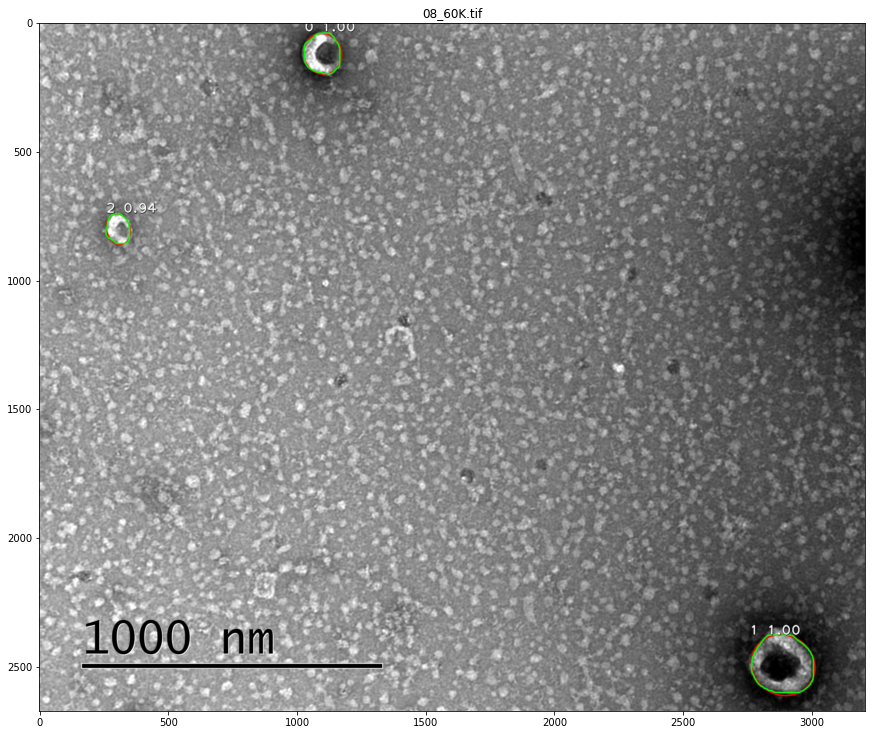

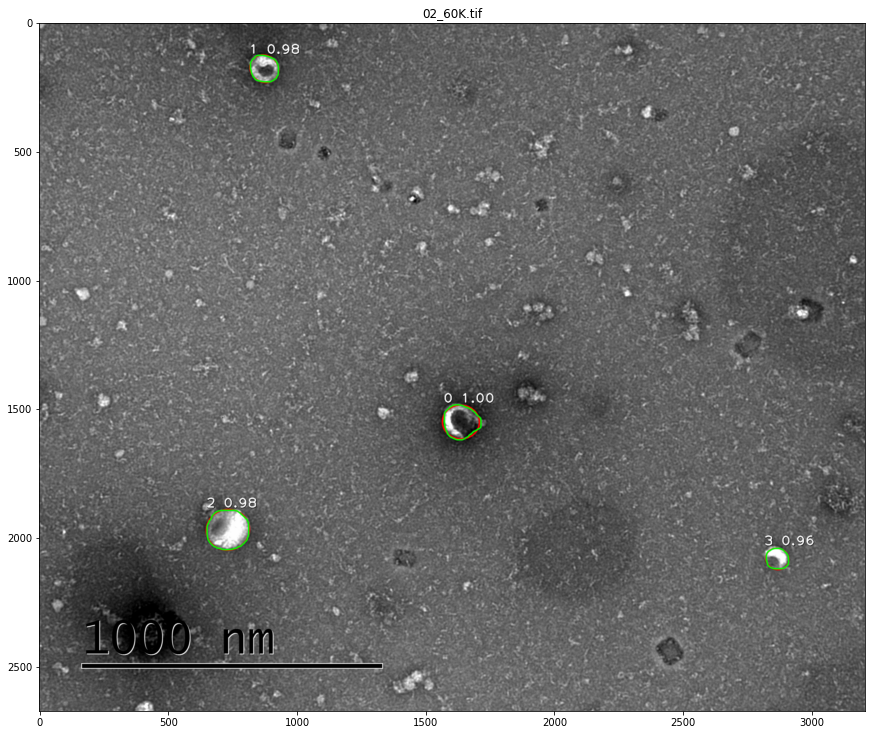

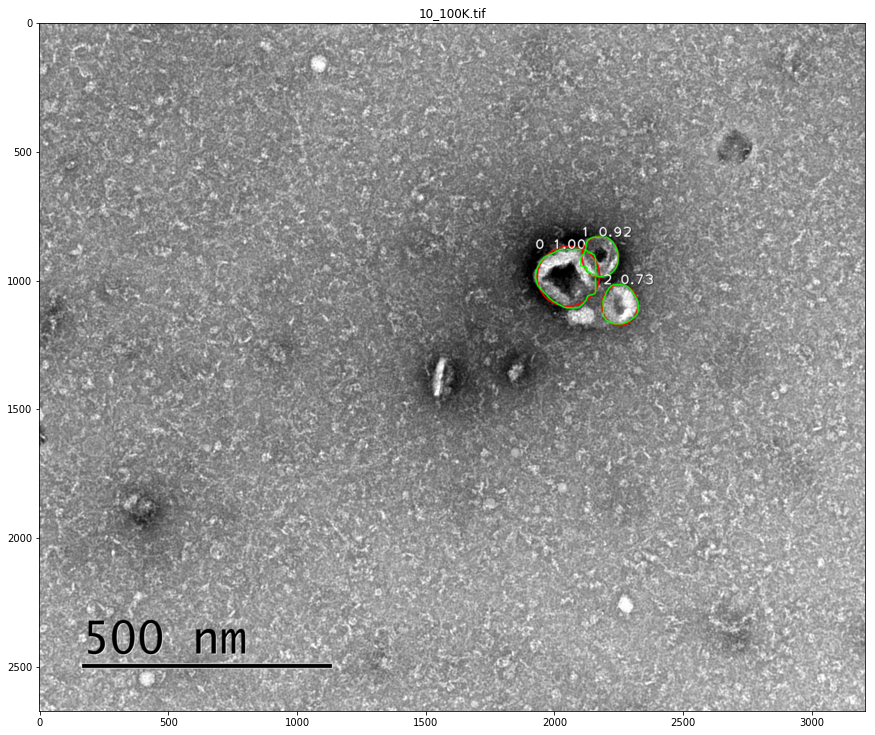

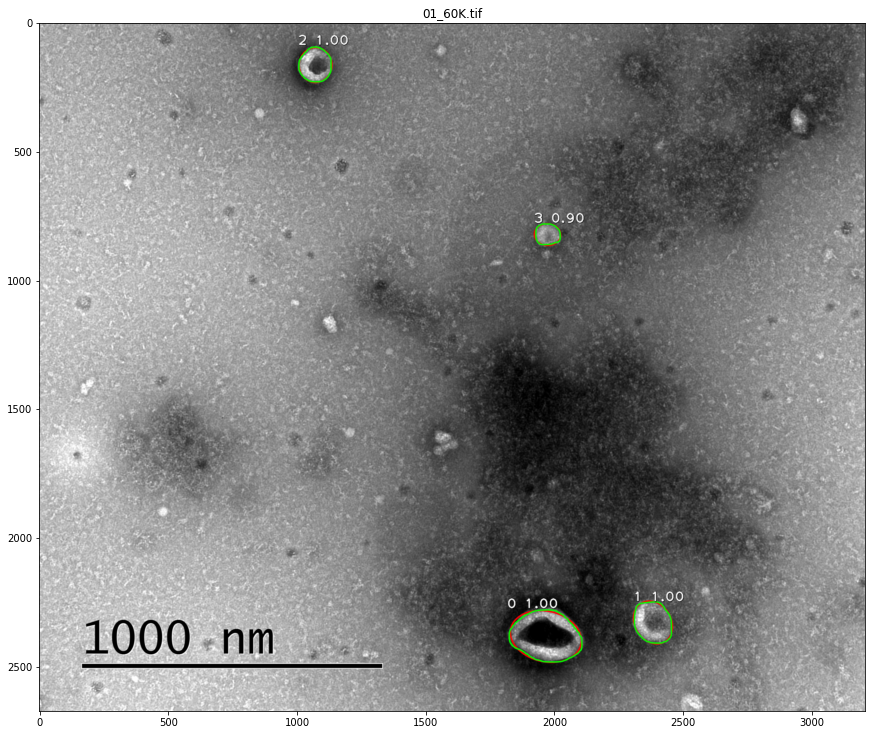

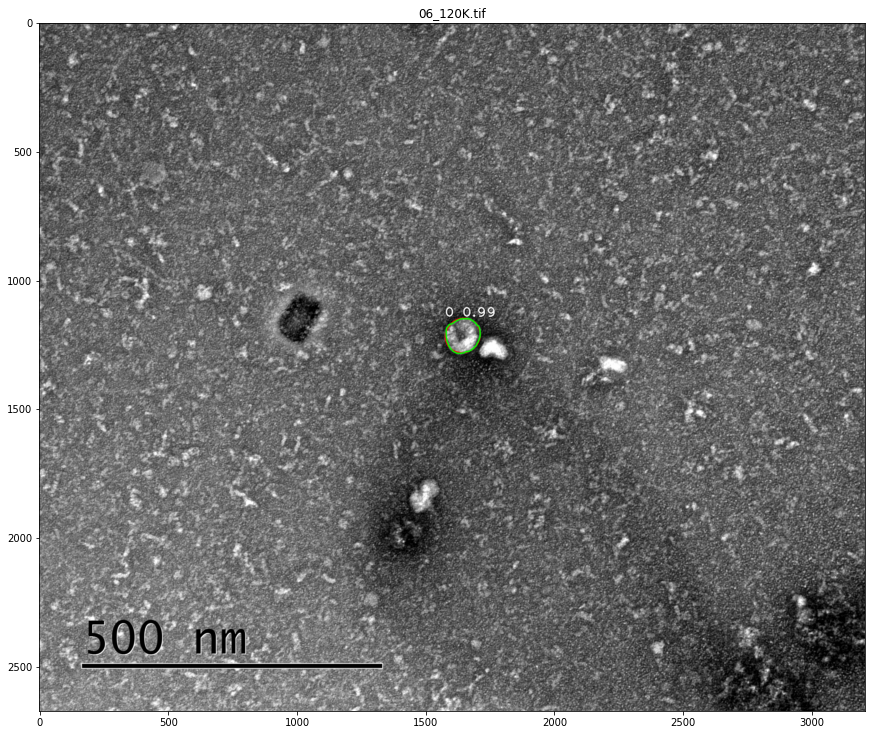

...

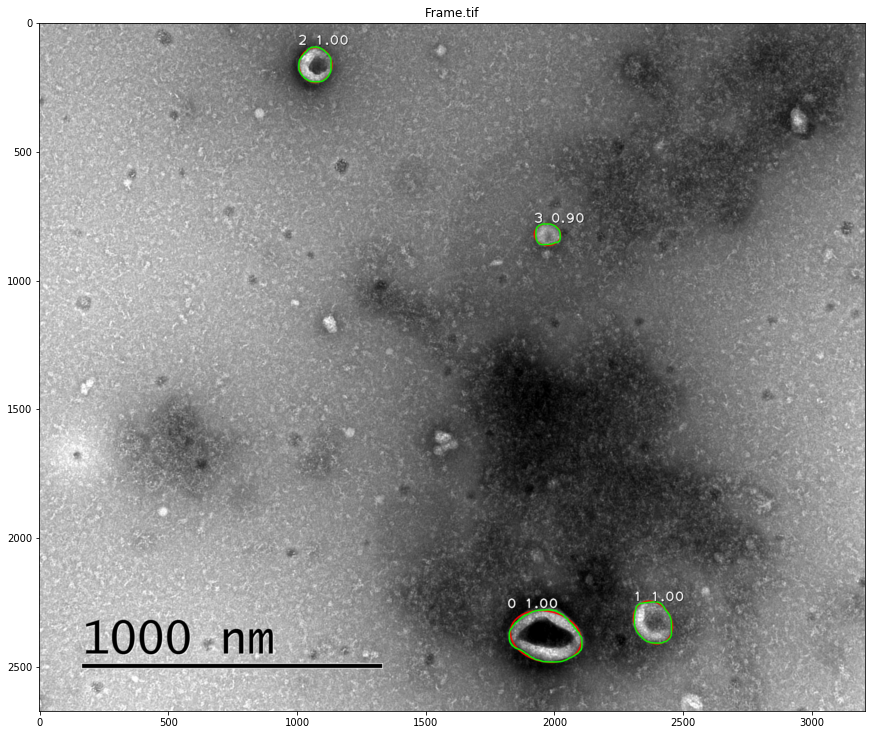

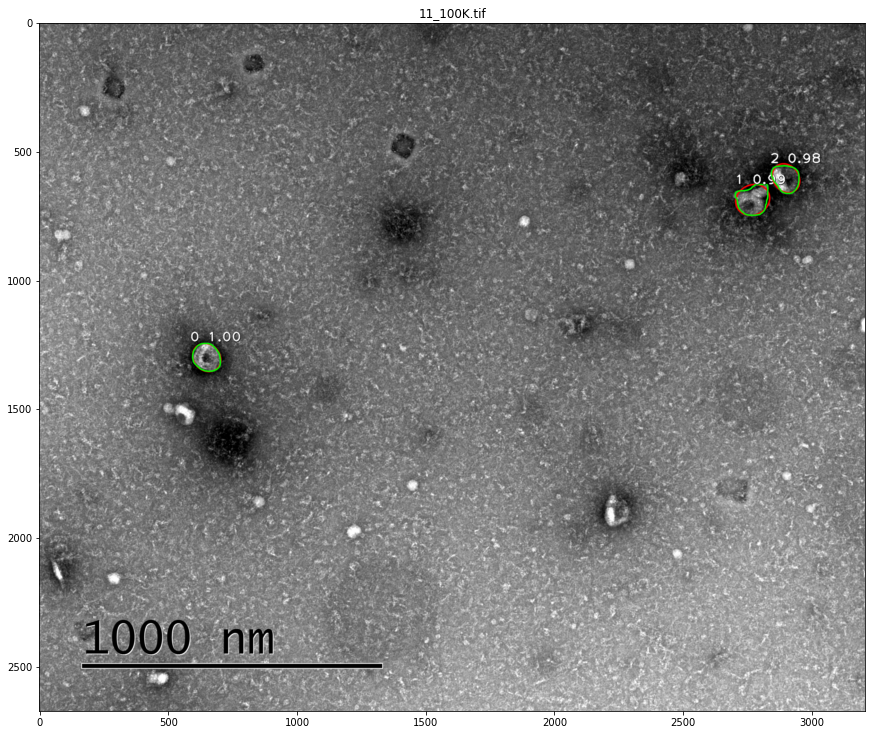

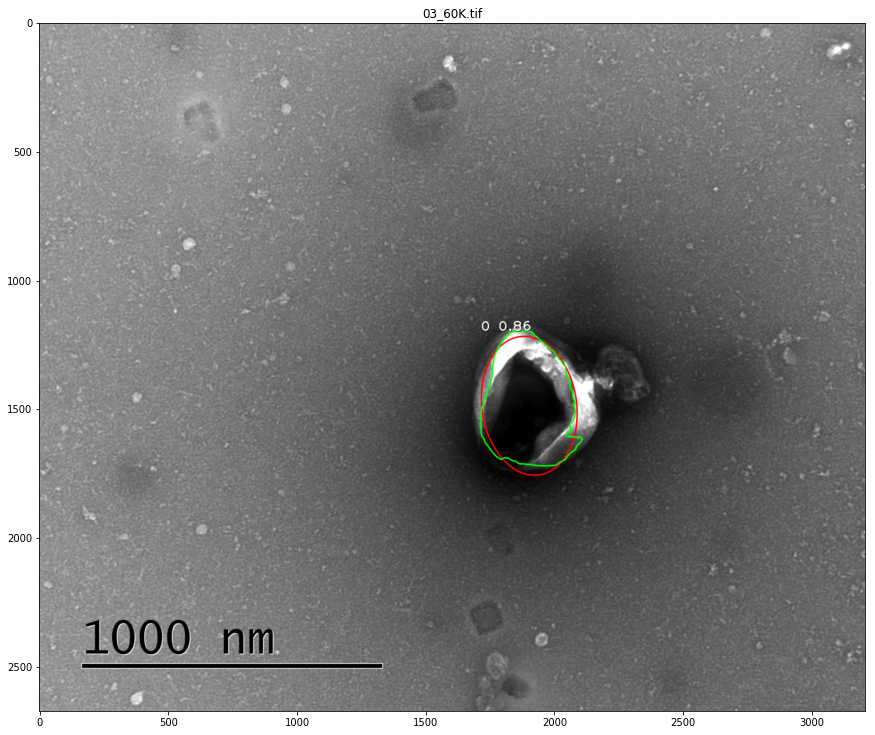

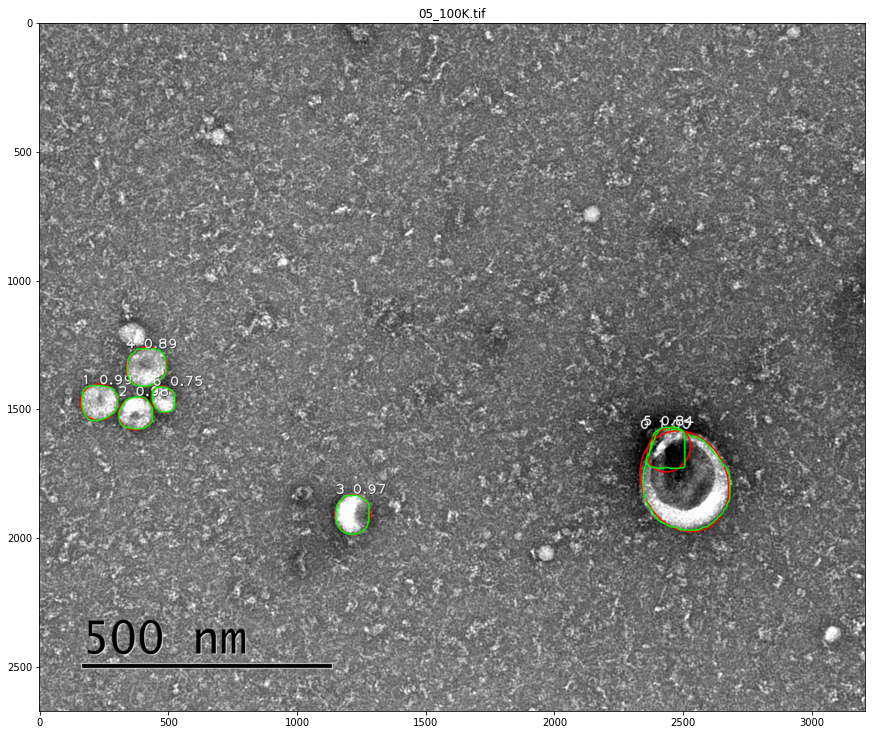

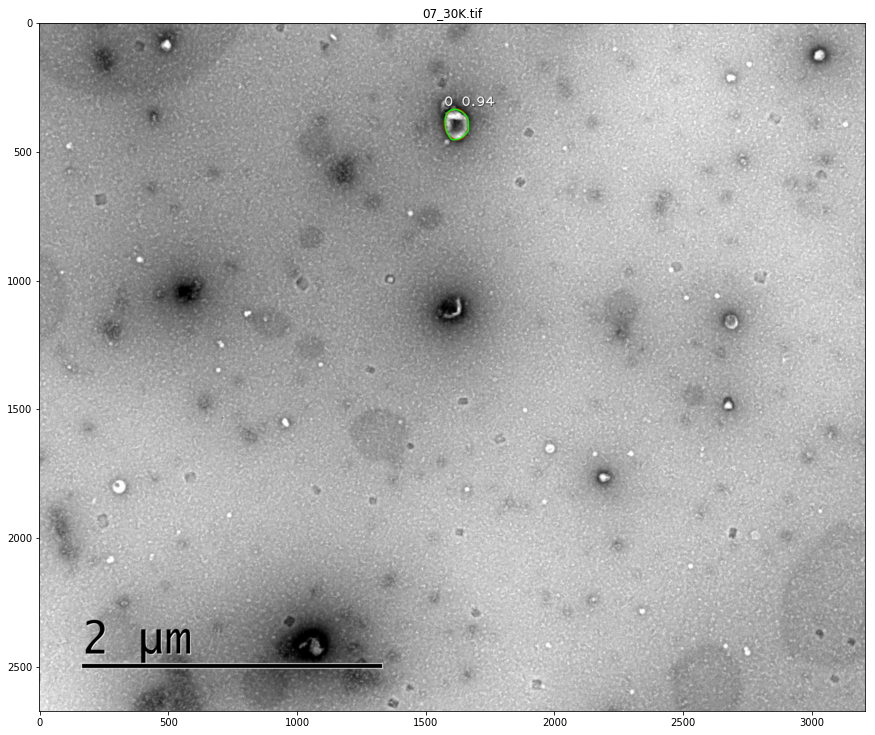

In [119]:
n = len(results_dict)
for i, name in enumerate(results_dict):
    image = imgs_copy[name]
    plt.figure(figsize=(15, 15 * n))
    plt.subplot(n, 1, i + 1)
    plt.title(name)
    plt.imshow(image[:, :, ::-1], interpolation='bilinear')
    plt.show()